ENFOQUE CAVIAR:
En la siguiente parte del trabajo se pretenden analizar distintas técnicas de segmentación para ver cual de ellas es la mejor. En primer lugar se importa la imagen y se observa que muestra celulas con distintas escalas de intensidad de color y sombras en las células además de una forma alargada, por lo que el enfoque será distinto a el del anterior trabajo.

Para decidir como valorar la eficacia de los métodos de segmentación, se ha calculado la densidad de las celulas en una porcion de la imagen y se ha extrapolado al resto de la imagen, para poder establecer un número de células al que se pretende llegar:
Imagen total: 61,5x62->x
Primer cuadrante: 10x10 ->58
Segundo cuadrante: 10x10->42
Media de las la densidad celular de cada cuadrante a la imagen total:
x= (1798+1302)/2=1550 células hay en total.

Durante todo le trabajo se evaluará la tasa de acierto del modelo como:

tasa de acierto = celulas contadas/celulas totales




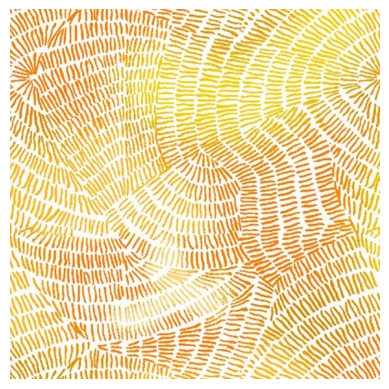

In [2]:
# Importar las librerías necesarias
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Especifica la ruta de la imagen en Google Colab
img_path = '/content/lineas_coloreadas.jpg'  # Asegúrate de reemplazar el nombre del archivo

# Cargar y mostrar la imagen
img = mpimg.imread(img_path)
imgplot = plt.imshow(img)
plt.axis('off')
plt.show()


A continuación se procede a umbralizar la imagen, dejandola en una escala de grises para que se eliminen las variaciones y que destaquen las partes importantes, además de que sea más fácil procesar la imagen. Como ya se habia dicho la intensidad de los colores de la imagen es muy variable por lo que se empieza intentando aplicar una umbralización binaria, pero al ver que esta no funciona se aplica la umbralización Tozero, la cual hace que los píxeles bajos se vuelven 0 (negro), pero los que están por encima del umbral conservan su valor original, manteniendo detalles en los píxeles más brillantes, dando lugar a un resultado mucho mejor. Más abajo se confirma:

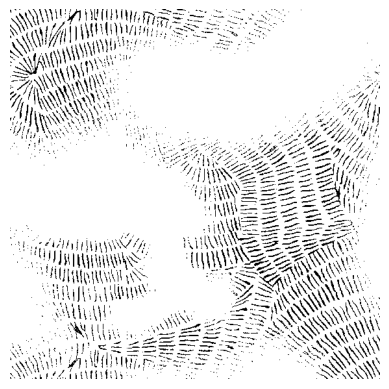

In [5]:
!pip install opencv-python==4.7.0.72
import cv2
gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
ret, thresh_img2 = cv2.threshold(gray_img, 127, 255, cv2.THRESH_BINARY)
plt.imshow(thresh_img2, cmap='gray')
plt.axis('off')
plt.show()

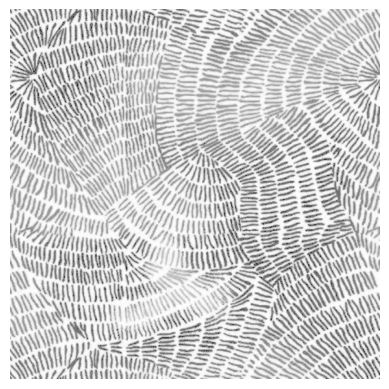

In [4]:
import cv2
gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
# Definir el rango de umbralización
lower_thresh = 100  # Umbral inferior
upper_thresh = 200  # Umbral superior

# Aplicar la umbralización
ret, thresh_img = cv2.threshold(gray_img, lower_thresh, upper_thresh, cv2.THRESH_TOZERO)
#THRESH_TOZERO establece los píxeles con valores por debajo del umbral inferior a cero, y los píxeles con valores por encima del umbral superior a 255.

plt.imshow(thresh_img, cmap='gray')
plt.axis('off')
plt.show()

A continuación se intenta hacer morfología matemática con apertura para separar las células que están muy juntas, pero no funciona bien esta operación y perjudica a la calidad de la imagen por lo que no se aplica morfología matemática:

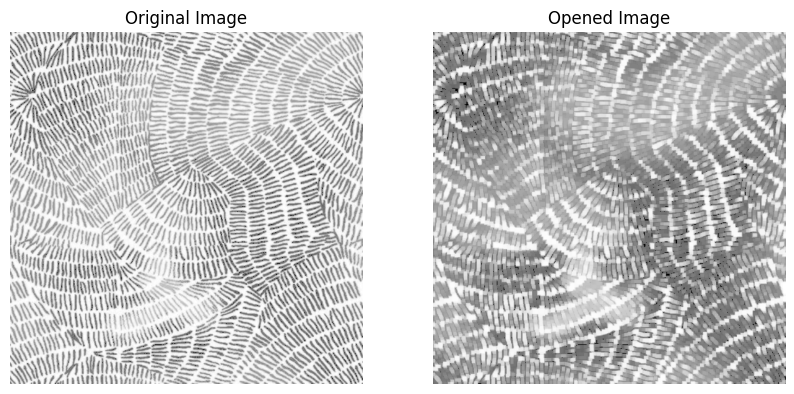

In [ ]:
import cv2
import matplotlib.pyplot as plt

# Assuming 'thresh_img' is already loaded

# Define the kernel (e.g., a 5x5 rectangular kernel)
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (5, 5))

# Apply opening
opened_image = cv2.morphologyEx(thresh_img, cv2.MORPH_OPEN, kernel)

# Display the original and opened images
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(thresh_img, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(opened_image, cmap='gray')
plt.title('Opened Image')
plt.axis('off')

plt.show()



Después se intenta aplicar detección de bordes con Canny ya que funciona mejor con mucho ruido y en entornos con luminosidad variabe. Sin embargo, los resultados no son muy buenos por que no segmenta todas las celulas y encima este no cuenta las celulas directamente.

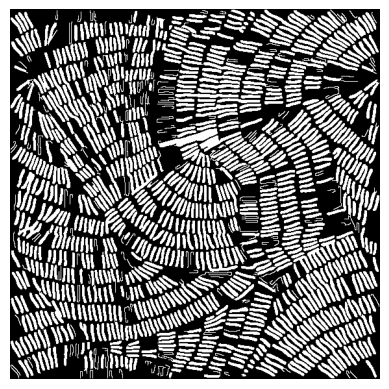

In [ ]:
from skimage.feature import canny
from scipy import ndimage as ndi
from skimage import morphology
edges = canny (thresh_img)
fill_coins = ndi.binary_fill_holes (edges)
coins_cleaned = morphology.remove_small_objects (fill_coins, 21)
plt.imshow(coins_cleaned, cmap='gray')
plt.axis('off')
plt.show()

A continuación se comienza a hacer un estudio de la mejor técnica para segmentar la imagen. En primer lugar se estudia el metodo de edge segmentation, que a pesar de lo visto en clase y que en este ejercicio podría juntar las lineas de contorno de las células, proporciona muy buen resultado, llegando a una segmentación con una tasa de acierto del 74% por lo que puede juntar algunas células pero no junta todas.

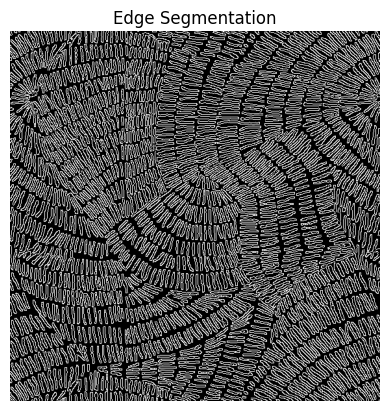

In [ ]:
import cv2

# Aplicar el detector de bordes Canny
edges = cv2.Canny(thresh_img, 100, 200)

# Mostrar la imagen con los bordes detectados
plt.imshow(edges, cmap='gray')
plt.title('Edge Segmentation')
plt.axis('off')
plt.show()

In [ ]:

import numpy as np

# Encontrar los componentes conectados
num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(edges, connectivity=8)

# El número total de segmentos es num_labels - 1 (se resta 1 para excluir el fondo)
total_segments = num_labels - 1

print(f"Número total de segmentos: {total_segments}")

Número total de segmentos: 1457


Además probamos el region growing, a pesar de que en una imagen con tanto cambio de intensidad de color no encaja para aplicar este metodo, ya que este segmenta en funcion de similitud de zonas. Sin embargo decidimos probarlo y el resultado fue muy malo como era de esperar:


Número de células con conectividad 4: 1


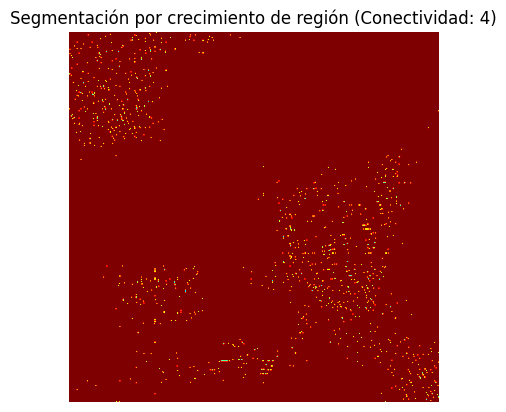

Número de células con conectividad 8: 1


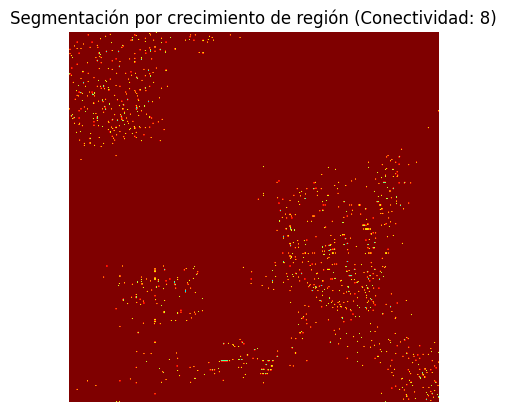

In [ ]:
import cv2
import numpy as np

for i in [4, 8]: # Change the loop to iterate over valid connectivity values

  # Aplicar el algoritmo de region growing
  num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(thresh_img, connectivity=i)

  # El número total de células es num_labels - 1 (se resta 1 para excluir el fondo)
  num_cells = num_labels - 1

  # Imprimir el número de células
  print(f"Número de células con conectividad {i}: {num_cells}") # Print connectivity value for clarity

  # Mostrar la imagen segmentada (opcional)
  plt.imshow(labels, cmap='jet')
  plt.title(f'Segmentación por crecimiento de región (Conectividad: {i})') # Update title with connectivity value
  plt.axis('off')
  plt.show()

Otro algoritmo que decidimos probar fue el region splitting que no sabíamos que resultado podía dar porque puede producir excesivas o escasas segmentaciones, no obstante merecia la pena comprobarlo. El resultado es una tasa de acierto muy grande del 66% y además las imagenes segmentadas que produce son difíciles de analizar

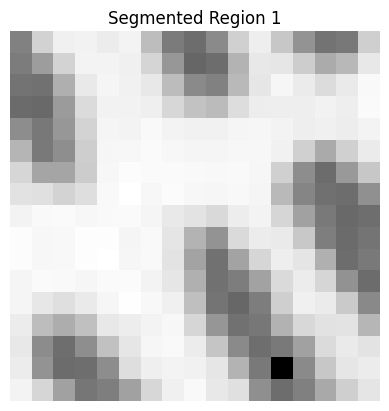

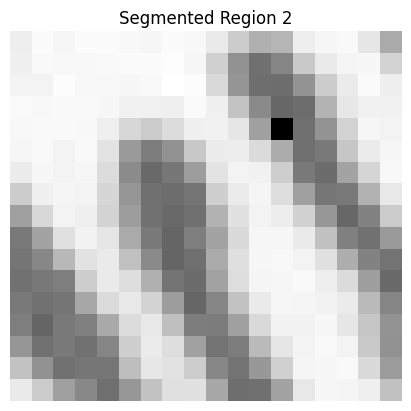

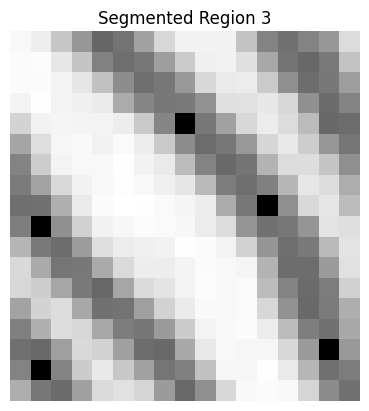

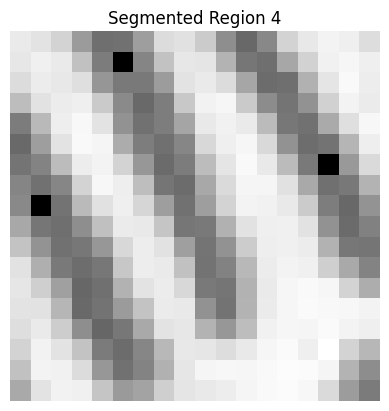

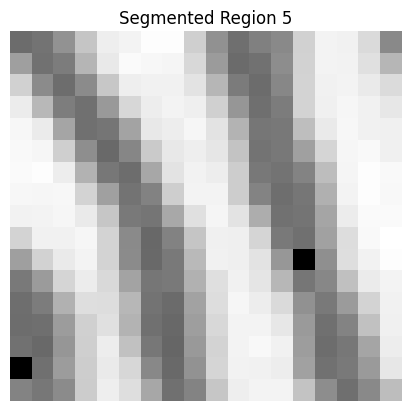

...

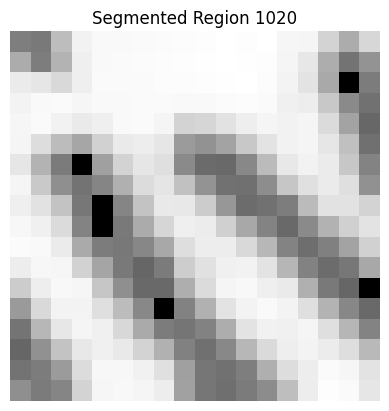

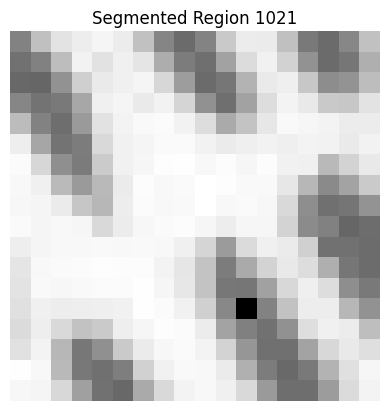

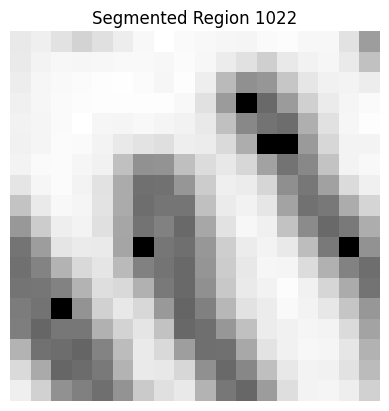

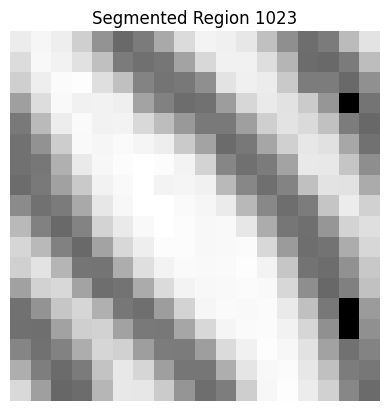

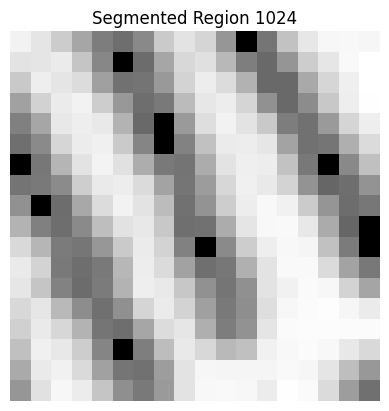

In [ ]:
import cv2
import numpy as np

def split_region(region, threshold, max_depth=10): # Added max_depth parameter
    """
    Recursively splits a region based on homogeneity.

    Args:
        region: The image region to split.
        threshold: The homogeneity threshold.
        max_depth: Maximum recursion depth to prevent infinite loops.

    Returns:
        A list of segmented regions.
    """

    # Base case: Stop recursion if max_depth is reached
    if max_depth == 0:
        return [region]

    # Calculate the mean intensity of the region
    mean_intensity = np.mean(region)

    # Check if the region is homogeneous
    if np.std(region) < threshold:
        return [region]

    # Split the region into four subregions
    height, width = region.shape
    half_height = height // 2
    half_width = width // 2

    subregions = [
        region[:half_height, :half_width],
        region[:half_height, half_width:],
        region[half_height:, :half_width],
        region[half_height:, half_width:]
    ]

    # Recursively split the subregions
    segmented_regions = []
    for subregion in subregions:
        # Decrement max_depth for each recursive call
        segmented_regions.extend(split_region(subregion, threshold, max_depth - 1))

    return segmented_regions




# Perform region splitting
# Added max_depth argument
segmented_regions = split_region(thresh_img, threshold=20, max_depth=5)  # Adjust threshold and max_depth as needed

# Display the segmented regions
for i, region in enumerate(segmented_regions):
    plt.imshow(region, cmap='gray')
    plt.title(f'Segmented Region {i+1}')
    plt.axis('off')
    plt.show()

# You can further process the segmented regions,
# like merging adjacent regions based on criteria or calculating properties.

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt



# Perform region splitting
segmented_regions = split_region(thresh_img, threshold=20, max_depth=5)

# Count the number of cells (regions)
num_cells = len(segmented_regions)

# Print the number of cells
print(f"Número de células: {num_cells}")

# Display the segmented regions (optional)
# ... (code for displaying regions remains the same) ...

Número de células: 1024


El algoritmo más prometedor y que más nos ha gustado el resultado es clustering segmentation. Este ha conseguido una tasa de acierto del 98% y la metodología de agrupar los pixeles en función de similitud ha demostrado ser un éxito rotundo a pesar de que podía generar segmentaciones excesivas o insuficientes. El porcentaje podría haber sido del 100% si no llega a ser por la averración que se nota que no ha captado y si se quisiera se podría investigar tratamiento de imagenes para quitar este tipo de aberraciones.


Número de células: 1520


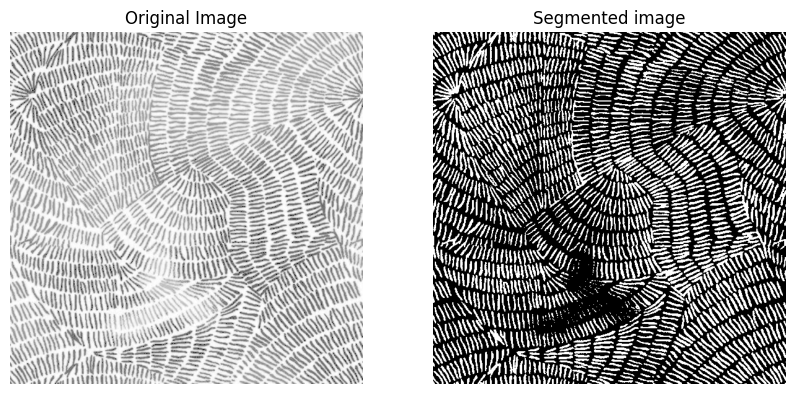

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

# Assuming 'thresh_img' is already loaded and thresholded

def count_cells_with_clustering(image, n_clusters=2):
    """
    Performs KMeans clustering and counts the segmented cells.

    Args:
        image: The input image (thresholded).
        n_clusters: The number of clusters for KMeans.

    Returns:
        The number of cells detected and the segmented image.
    """
    # 1. Reshape for KMeans
    pixels = image.reshape((-1, 1))

    # 2. Apply KMeans clustering
    kmeans = KMeans(n_clusters=n_clusters, random_state=0)
    kmeans.fit(pixels)
    labels = kmeans.labels_
    segmented_image = labels.reshape(image.shape)

    # 3. Count cells using connectedComponentsWithStats
    num_labels, _, _, _ = cv2.connectedComponentsWithStats(
        segmented_image.astype(np.uint8), connectivity=8
    )
    num_cells = num_labels - 1  # Exclude background

    return num_cells, segmented_image


# Example usage:
num_cells, segmented_image = count_cells_with_clustering(thresh_img, n_clusters=2)  # Adjust n_clusters if needed
print(f"Número de células: {num_cells}")

# Display the segmented image
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(thresh_img, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(segmented_image, cmap='gray')
plt.title('Segmented image')
plt.axis('off')
plt.show()


El watershed al igual que otros métodos de segmentación ha resultado ser un fracaso y es probable que sea difícil de implementar para que encuentre los valles en este tipo de imágenes, ya que al difuminarla pierde todo el sentido.

Number of cells: 1099


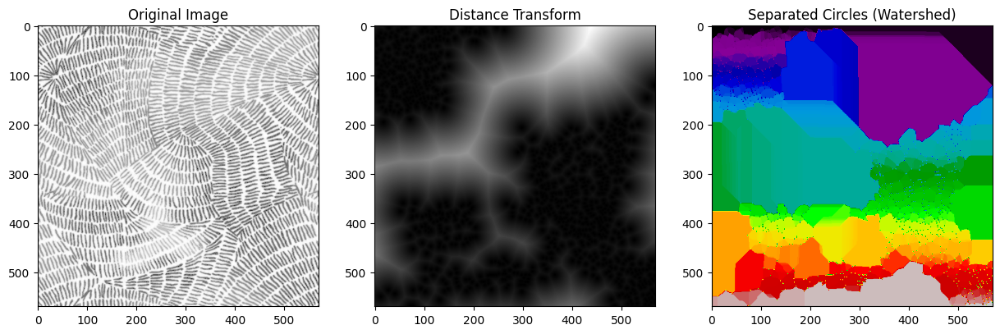

In [ ]:
import numpy as np
from skimage import io, morphology, measure, segmentation, filters
from scipy import ndimage as ndi
import matplotlib.pyplot as plt


# Step 1: Compute the distance transform
distance = ndi.distance_transform_edt(thresh_img)

# Step 2: Find local maxima (these will be the markers for the watershed algorithm)
local_maxi = morphology.local_maxima(distance)

# Step 3: Label the markers
markers, _ = ndi.label(local_maxi)

# Step 4: Apply the watershed algorithm
labels = segmentation.watershed(-distance, markers, mask=thresh_img)

# Step 5: Count the number of unique labels (excluding the background, label 0)
num_circles = len(np.unique(labels)) - 1  # Subtract 1 to exclude background

print(f"Number of cells: {num_circles}")

# Step 6: Display the results
fig, ax = plt.subplots(1, 3, figsize=(15, 5))

# Original dilated image
ax[0].imshow(thresh_img, cmap='gray')
ax[0].set_title('Original Image')

# Distance transform
ax[1].imshow(distance, cmap='gray')
ax[1].set_title('Distance Transform')

# Segmentation result
ax[2].imshow(labels, cmap='nipy_spectral')
ax[2].set_title('Separated Circles (Watershed)')

plt.show()


La segmentación basada en gráfico tambien ha sido un exito con una tasa de acierto del 93%,  hemos demostrado la eficacia de este algoritmo. Esto tiene sentido ya que este algoritmo se basa en establecer una serie de pesos con los píxeles vecinos y en base a esto establece un grado de similitud para la segmentación, por lo que son algoritmos muy precisos y encajan muy bien con el tipo de imagen analizada.

Número de células: 1656


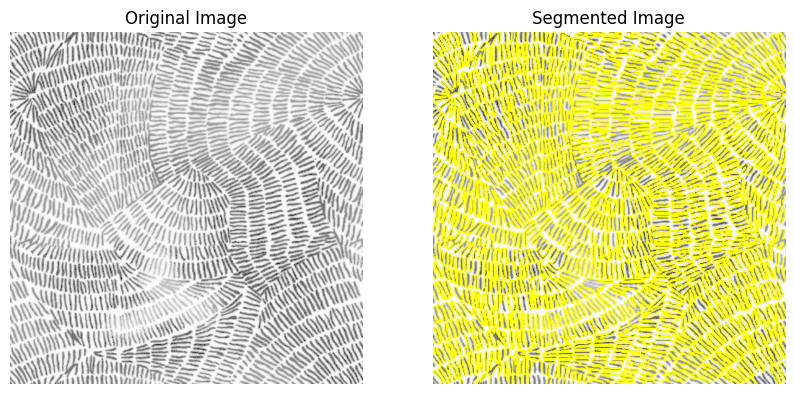

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.segmentation import felzenszwalb, mark_boundaries

def count_cells_graph_based(image):
    """
    Performs graph-based segmentation using Felzenszwalb's algorithm and counts cells.

    Args:
        image: The input image (thresholded).

    Returns:
        The number of cells detected.
    """
    # 1. Apply Felzenszwalb's algorithm for segmentation
    segments = felzenszwalb(image, scale=100, sigma=0.5, min_size=50)
    # Adjust scale, sigma, and min_size for better results

    # 2. Count the number of unique segments (cells)
    num_cells = len(np.unique(segments))

    return num_cells, segments


# Assuming 'thresh_img' is already loaded and thresholded
num_cells, segments = count_cells_graph_based(thresh_img)
print(f"Número de células: {num_cells}")


# Display the segmented image (optional)
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(thresh_img, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(mark_boundaries(thresh_img, segments))  # Visualize segment boundaries
plt.title('Segmented Image')
plt.axis('off')

plt.show()

Por último intentamos ver si la implementación de superpixeles podía ser compatible, pero esta resulto ser imposible de implementar debido a que inicializa cada parte como una región mas grande de lo que mide cada célula por lo que no tiene sentido tratar de aplicar este tipo de segmentación.

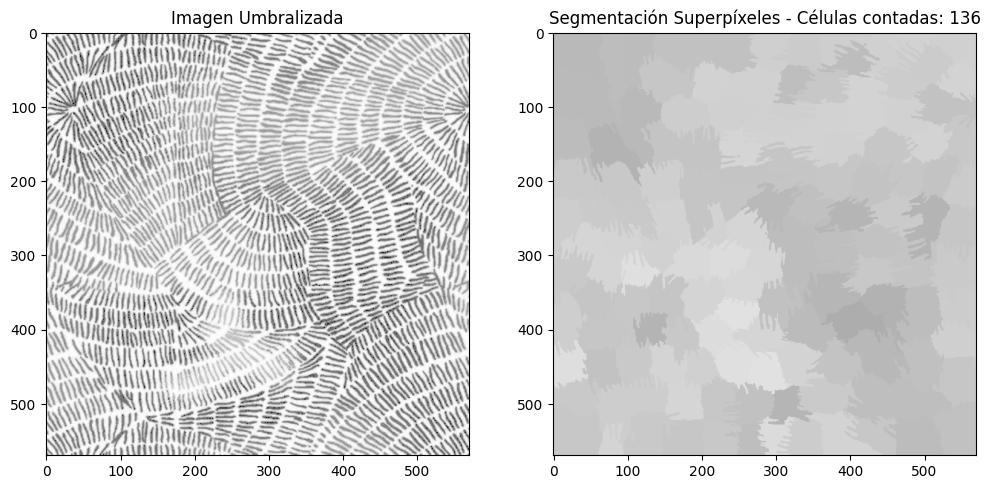

Número de células contadas: 136


In [ ]:
import cv2
import numpy as np
from skimage.segmentation import slic
from skimage.color import label2rgb
from skimage.measure import label, regionprops
from matplotlib import pyplot as plt

# Supongamos que 'thresh_img' es la imagen binaria umbralizada de las células alienígenas

# 1. Convertir la imagen binaria a RGB para poder aplicar SLIC
image_rgb = cv2.cvtColor(thresh_img, cv2.COLOR_GRAY2BGR)

# 2. Aplicar la segmentación de superpíxeles usando SLIC
# Ajusta el número de segmentos (superpíxeles) y la compactación según tu imagen
n_segments = 300  # Número de superpíxeles
compactness = 10  # Controla la compacidad de los superpíxeles (ajústalo si es necesario)

superpixels = slic(image_rgb, n_segments=n_segments, compactness=compactness)

# 3. Convertir los superpíxeles a una imagen en color para visualización
superpixel_image = label2rgb(superpixels, image_rgb, kind='avg')

# 4. Etiquetar las regiones de los superpíxeles
labeled_superpixels = label(superpixels)

# 5. Contar el número de células (basado en las propiedades de las regiones)
props = regionprops(labeled_superpixels)
num_cells = len(props)

# 6. Visualizar los resultados
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(thresh_img, cmap='gray')
plt.title('Imagen Umbralizada')

plt.subplot(1, 2, 2)
plt.imshow(superpixel_image)
plt.title(f'Segmentación Superpíxeles - Células contadas: {num_cells}')

plt.show()

print(f'Número de células contadas: {num_cells}')


Se concluye por lo tanto que los mejores métodos de sementación para este tipo de células son en primer lugar el algoritmo de segmentación tipo clustering en segundo lugar la basada en gráfico y en tercer lugar el edge segmentation.